# 18- Generative Adversarial Networks

by [Alejandro Correa Bahnsen](http://www.albahnsen.com/)

version 1.0, July 2018

## Part of the class [Applied Deep Learning](https://github.com/albahnsen/AppliedDeepLearningClass)

This notebook is licensed under a [Creative Commons Attribution-ShareAlike 3.0 Unported License](http://creativecommons.org/licenses/by-sa/3.0/deed.en_US). Special thanks goes to [Rowel Atienza](https://towardsdatascience.com/gan-by-example-using-keras-on-tensorflow-backend-1a6d515a60d0) and [Diego Gomez](https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f) [Erik Lindernoren](https://github.com/eriklindernoren/Keras-GAN/blob/master/dcgan/dcgan.py)

Generative Adversarial Networks (GAN) is one of the most promising recent developments in Deep Learning. [GAN](http://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf), introduced by Ian Goodfellow in 2014, attacks the problem of unsupervised learning by training two deep networks, called Generator and Discriminator, that compete and cooperate with each other. In the course of training, both networks eventually learn how to perform their tasks.

<img src="images/gan1.jpeg" >

Some other examples:

<ul class="postList"><li name="707c" id="707c" class="graf graf--li graf-after--figure"><a href="https://www.theverge.com/2017/10/30/16569402/ai-generate-fake-faces-celebs-nvidia-gan" data-href="https://www.theverge.com/2017/10/30/16569402/ai-generate-fake-faces-celebs-nvidia-gan" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">AI Generates Fake Celebrity Faces</a> (<a href="http://research.nvidia.com/publication/2017-10_Progressive-Growing-of" data-href="http://research.nvidia.com/publication/2017-10_Progressive-Growing-of" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">Paper</a>)</li><li name="0673" id="0673" class="graf graf--li graf-after--li"><a href="https://www.technologyreview.com/s/609469/this-ai-learns-your-fashion-sense-and-invents-your-next-outfit/" data-href="https://www.technologyreview.com/s/609469/this-ai-learns-your-fashion-sense-and-invents-your-next-outfit/" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">AI Learns Fashion Sense</a> (<a href="https://arxiv.org/pdf/1711.02231.pdf" data-href="https://arxiv.org/pdf/1711.02231.pdf" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">Paper</a>)</li><li name="f7cf" id="f7cf" class="graf graf--li graf-after--li"><a href="https://junyanz.github.io/CycleGAN/" data-href="https://junyanz.github.io/CycleGAN/" class="markup--anchor markup--li-anchor" rel="nofollow noopener" target="_blank">Image to Image Translation using Cycle-Consistent Adversarial Neural Networks</a></li><li name="7a4d" id="7a4d" class="graf graf--li graf-after--li"><a href="https://www.technologyreview.com/s/608195/machine-creativity-beats-some-modern-art/" data-href="https://www.technologyreview.com/s/608195/machine-creativity-beats-some-modern-art/" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">AI Creates Modern Art</a> (<a href="https://arxiv.org/abs/1706.07068" data-href="https://arxiv.org/abs/1706.07068" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">Paper</a>)</li><li name="3f21" id="3f21" class="graf graf--li graf-after--li"><a href="https://motherboard.vice.com/en_us/article/a3dn9j/this-deep-learning-ai-generated-thousands-of-creepy-cat-pictures" data-href="https://motherboard.vice.com/en_us/article/a3dn9j/this-deep-learning-ai-generated-thousands-of-creepy-cat-pictures" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">This Deep Learning AI Generated Thousands of Creepy Cat Pictures</a></li><li name="917e" id="917e" class="graf graf--li graf-after--li"><a href="https://qz.com/817604/mits-nightmare-machine-uses-artificial-intelligence-to-create-horrific-images-of-ghoulish-faces-and-scary-places/" data-href="https://qz.com/817604/mits-nightmare-machine-uses-artificial-intelligence-to-create-horrific-images-of-ghoulish-faces-and-scary-places/" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">MIT is using AI to create pure horror</a></li><li name="5e41" id="5e41" class="graf graf--li graf-after--li"><a href="https://www.theverge.com/2017/8/24/16195858/amazon-ai-fashion-designer" data-href="https://www.theverge.com/2017/8/24/16195858/amazon-ai-fashion-designer" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">Amazon’s new algorithm designs clothing by analyzing a bunch of pictures</a></li><li name="54f8" id="54f8" class="graf graf--li graf-after--li graf--trailing"><a href="https://www.inverse.com/article/39018-these-neutral-networks-can-generate-realistic-photos" data-href="https://www.inverse.com/article/39018-these-neutral-networks-can-generate-realistic-photos" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">AI creates Photo-realistic Images</a> (<a href="https://arxiv.org/pdf/1711.11585.pdf" data-href="https://arxiv.org/pdf/1711.11585.pdf" class="markup--anchor markup--li-anchor" rel="noopener nofollow" target="_blank">Paper</a>)</li></ul>

Output of a GAN through time, learning to Create Hand-written digits.

<img src="images/gan2.gif" >

# Overview

<img src="images/gan3.jpeg" >

[source](http://www.kdnuggets.com/2017/01/generative-adversarial-networks-hot-topic-machine-learning.html)

Generative Adversarial Networks are composed of two models:

* The first model is called a **Generator** $G(z,\theta_1)$ and it aims to generate new data similar to the expected one, such that, the noice $z$ is mapped to the desired distribution $x$. The Generator could be asimilated to a human art forger, which creates fake works of art.

* The second model is named the **Discriminator** $D(x,\theta_2)$. This model’s goal is to recognize if an input data is ‘real’ — belongs to the original dataset — or if it is ‘fake’ — generated by a forger. In this scenario, a Discriminator is analogous to the police (or an art expert), which tries to detect artworks as truthful or fraud.

How do these models interact? Paraphrasing the original paper which proposed this framework, it can be thought of the Generator as having an adversary, the Discriminator. The Generator (forger) needs to learn how to create data in such a way that the Discriminator isn’t able to distinguish it as fake anymore. The competition between these two teams is what improves their knowledge, until the Generator succeeds in creating realistic data.

As a result, the Discriminator is trained to correctly classify the input data as either real or fake. This means it’s weights are updated as to maximize the probability that any real data input x is classified as belonging to the real dataset, while minimizing the probability that any fake image is classified as belonging to the real dataset. In more technical terms, the loss/error function used maximizes the function $D(x)$, and it also minimizes $D(G(z))$.

Furthermore, the Generator is trained to fool the Discriminator by generating data as realistic as possible, which means that the Generator’s weight’s are optimized to maximize the probability that any fake image is classified as belonging to the real datase. Formally this means that the loss/error function used for this network maximizes $D(G(z))$.

Since during training both the Discriminator and Generator are trying to optimize opposite loss functions, they can be thought of two agents playing a minimax game with value function $V(G,D)$. In this minimax game, the generator is trying to maximize it’s probability of having it’s outputs recognized as real, while the discriminator is trying to minimize this same value.

<img src="images/gan4.png" >

## Training a GAN

<img src="images/gan5.png" >

The fundamental steps to train a GAN can be described as following:

1. Sample a noise set and a real-data set, each with size m.
2. Train the Discriminator on this data.
3. Sample a different noise subset with size m.
4. Train the Generator on this data.
5. Repeat from Step 1.

# Example: MNIST Handwritten Digit Recognition

The MNIST problem is a dataset developed by Yann LeCun, Corinna Cortes and Christopher Burges for evaluating machine learning models on the handwritten digit classification problem.

The dataset was constructed from a number of scanned document dataset available from the National Institute of Standards and Technology (NIST). This is where the name for the dataset comes from, as the Modified NIST or MNIST dataset.

Images of digits were taken from a variety of scanned documents, normalized in size and centered. This makes it an excellent dataset for evaluating models, allowing the developer to focus on the machine learning with very little data cleaning or preparation required.

Each image is a 28 by 28 pixel square (784 pixels total). A standard spit of the dataset is used to evaluate and compare models, where 60,000 images are used to train a model and a separate set of 10,000 images are used to test it.

It is a digit recognition task. As such there are 10 digits (0 to 9) or 10 classes to predict. Results are reported using prediction error, which is nothing more than the inverted classification accuracy.

Excellent results achieve a prediction error of less than 1%. State-of-the-art prediction error of approximately 0.2% can be achieved with large Convolutional Neural Networks. There is a listing of the state-of-the-art results and links to the relevant papers on the MNIST and other datasets on Rodrigo Benenson’s webpage.

In [1]:
import tensorflow as tf
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
import keras
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())

/home/al/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


['/job:localhost/replica:0/task:0/device:GPU:0']


Using TensorFlow backend.


In [2]:
# Plot ad hoc mnist instances
from keras.datasets import mnist
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.image as mgimg
from IPython.display import HTML

import os
import numpy as np
from tqdm import tqdm

%matplotlib notebook
%matplotlib notebook

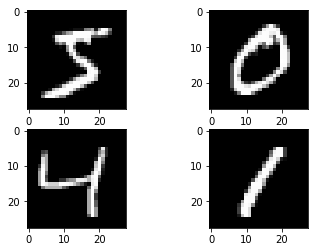

In [3]:
# load (downloaded if needed) the MNIST dataset
(X_train, y_train), (X_test, y_test) = mnist.load_data()
# plot 4 images as gray scale
plt.subplot(221)
plt.imshow(X_train[0], cmap=plt.get_cmap('gray'))
plt.subplot(222)
plt.imshow(X_train[1], cmap=plt.get_cmap('gray'))
plt.subplot(223)
plt.imshow(X_train[2], cmap=plt.get_cmap('gray'))
plt.subplot(224)
plt.imshow(X_train[3], cmap=plt.get_cmap('gray'))
# show the plot
plt.show()

In [4]:
X_train.shape, X_test.shape

((60000, 28, 28), (10000, 28, 28))

In [5]:
y_train

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

In [6]:
#expand 1 more dimention as 1 for colour channel gray
X_test = X_test.reshape(X_test.shape[0], 28, 28,1)
X_train = X_train.reshape(X_train.shape[0], 28, 28, 1)

The input values which range in between [0, 255] will be normalized between -1 and 1. [useful ‘hacks’ proven to be useful for training GANs](https://github.com/soumith/ganhacks)

In [7]:
X_train = (X_train.astype(np.float32) - 127.5)/127.5
X_test = (X_test.astype(np.float32) - 127.5)/127.5

In [8]:
from keras.utils import to_categorical
from keras.layers import Dense, Flatten, Activation, Dropout, BatchNormalization, Input
from keras.layers import Conv2D, UpSampling2D, Conv2DTranspose, Reshape, LeakyReLU
from keras.layers import multiply, Embedding, ZeroPadding2D
from keras.models import Sequential, Model
from keras.optimizers import RMSprop, Adam
from keras.callbacks import History
from livelossplot import PlotLossesKeras

In [9]:
# convert to one-hot encoding
Y_train = to_categorical(y_train)
Y_test = to_categorical(y_test)
num_classes = Y_train.shape[1]
y_train = y_train.reshape(-1, 1)
y_test = y_test.reshape(-1, 1)

# GAN

## Discriminator

A discriminator that tells how real an image is, is basically a deep Convolutional Neural Network (CNN). For MNIST Dataset, the input is an image (28 pixel x 28 pixel x 1 channel). The sigmoid output is a scalar value of the probability of how real the image is (0.0 is certainly fake, 1.0 is certainly real, anything in between is a gray area). The difference from a typical CNN is the absence of max-pooling in between layers. Instead, a strided convolution is used for downsampling. The activation function used in each CNN layer is a leaky ReLU. A dropout between 0.4 and 0.7 between layers prevent over fitting and memorization. 

<img src="images/gan7.png" >

In [10]:
depth = 64
input_shape = (28, 28, 1)

optimizer = Adam(0.0002, 0.5)

In [11]:
Discriminator = Sequential()

# First layer
Discriminator.add(Conv2D(depth*1, 5, strides=2, input_shape=input_shape, padding='same'))
Discriminator.add(LeakyReLU(0.2))
Discriminator.add(Dropout(0.4))

# Second layer
Discriminator.add(Conv2D(depth*2, 5, strides=2, padding='same'))
Discriminator.add(LeakyReLU(0.2))
Discriminator.add(Dropout(0.4))

#Third layer
Discriminator.add(Conv2D(depth*4, 5, strides=2, padding='same'))
Discriminator.add(LeakyReLU(0.2))
Discriminator.add(Dropout(0.4))

#Fourth layer
Discriminator.add(Conv2D(depth*8, 5, strides=1, padding='same'))
Discriminator.add(LeakyReLU(0.2))
Discriminator.add(Dropout(0.4))

# Output layer
Discriminator.add(Flatten())
Discriminator.add(Dense(1))
Discriminator.add(Activation('sigmoid'))

Discriminator.summary()

# Define the network
img = Input(shape=input_shape)

# Output
validity = Discriminator(img)

Discriminator = Model(img, validity)


Discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 14, 14, 64)        1664      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 7, 128)         204928    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 7, 7, 128)         0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         819456    
__________

## Generator

The generator synthesizes fake images. The fake image is generated from a 100-dimensional noise (uniform distribution between -1.0 to 1.0) using the inverse of convolution, called transposed convolution. Instead of fractionally-strided convolution as suggested in DCGAN, upsampling between the first three layers is used since it synthesizes more realistic handwriting images. In between layers, batch normalization stabilizes learning. The activation function after each layer is a ReLU. The output of the sigmoid at the last layer produces the fake image. Dropout of between 0.3 and 0.5 at the first layer prevents overfitting.

<img src="images/gan6.png" >

In [12]:
dim = 7
depth = 256
randomDim = 100

In [13]:
Generator = Sequential()

# First layer
Generator.add(Dense(dim*dim*depth, input_dim=randomDim))
Generator.add(BatchNormalization(momentum=0.9))
Generator.add(Activation('relu'))
Generator.add(Reshape((dim, dim, depth)))
Generator.add(Dropout(0.4))

# Second layer
Generator.add(UpSampling2D())
Generator.add(Conv2DTranspose(int(depth/2), 5, padding='same'))
Generator.add(BatchNormalization(momentum=0.9))
Generator.add(Activation('relu'))

# Third layer
Generator.add(UpSampling2D())
Generator.add(Conv2DTranspose(int(depth/4), 5, padding='same'))
Generator.add(BatchNormalization(momentum=0.9))
Generator.add(Activation('relu'))

# Fourth layer
Generator.add(Conv2DTranspose(int(depth/8), 5, padding='same'))
Generator.add(BatchNormalization(momentum=0.9))
Generator.add(Activation('relu'))

# Fifth layer
Generator.add(Conv2DTranspose(1, 5, padding='same'))
Generator.add(Activation('tanh'))

Generator.summary()

# Create network
noise = Input(shape=(randomDim,))
img = Generator(noise)

Generator = Model(noise, img)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 12544)             1266944   
_________________________________________________________________
batch_normalization_1 (Batch (None, 12544)             50176     
_________________________________________________________________
activation_2 (Activation)    (None, 12544)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 256)         0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 7, 7, 256)         0         
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 14, 14, 256)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 128)       819328    
__________

## Adversarial model

The adversarial model is just the generator-discriminator stacked together The Generator part is trying to fool the Discriminator and learning from its feedback at the same time. The training parameters are the same as in the Discriminator model except for a reduced learning rate and corresponding weight decay.

<img src="images/gan8.png" >

In [14]:
# The generator takes noise as input and generates imgs
noise = Input(shape=(randomDim,))
img = Generator(noise)

# For the combined model we will only train the generator
Discriminator.trainable = False

# The discriminator takes generated image as input and determines validity
valid = Discriminator(img)

# The combined model  (stacked generator and discriminator)
# Trains the generator to fool the discriminator
dcgan = Model(noise, valid)
dcgan.compile(loss='binary_crossentropy', optimizer=optimizer)

dcgan.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 100)               0         
_________________________________________________________________
model_2 (Model)              (None, 28, 28, 1)         2394241   
_________________________________________________________________
model_1 (Model)              (None, 1)                 4311553   
Total params: 6,705,794
Trainable params: 2,368,705
Non-trainable params: 4,337,089
_________________________________________________________________


## Training

Training is the hardest part. We determine first if Discriminator model is correct by training it alone with real and fake images. Afterwards, the Discriminator and Adversarial models are trained one after the other.

<img src="images/gan10.png" >

In [15]:
# Create a wall of generated MNIST images
def plotGeneratedImages(epoch, noise, examples=100, dim=(10, 10), figsize=(10, 10)):
    
    generatedImages = Generator.predict(noise_plots) * 0.5 + 0.5

    plt.figure(figsize=figsize)
    for i in range(generatedImages.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generatedImages[i,:,:,0], cmap='gray')
        plt.axis('off')
#     plt.tight_layout()
    plt.savefig("images/gan_images/mnist_%d.png" % epoch)
    plt.close()

In [16]:
def train_epoch():
    
    # Adversarial ground truths
    valid = np.ones((batchSize, 1))
    fake = np.zeros((batchSize, 1))
        
    # Get a random set of input noise and images
    noise = np.random.normal(0, 1, size=[batchSize, randomDim])
    idx = np.random.randint(0, X_train.shape[0], size=batchSize)
    imageBatch = X_train[idx]

    # Generate fake MNIST images
    generatedImages = Generator.predict(noise)

    # Train the discriminator
    Discriminator.trainable = True
    d_loss_real = Discriminator.train_on_batch(imageBatch, valid)
    d_loss_fake = Discriminator.train_on_batch(generatedImages, fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
    Discriminator.trainable = False

    # Train the generator
    g_loss = dcgan.train_on_batch(noise, valid)

    return d_loss, g_loss

In [17]:
np.random.seed(42)
batchSize = 32
epochs = 4000
save_interval = 50

In [18]:
# For plots
noise_plots = np.random.normal(0, 1, size=[100, randomDim])

In [19]:
Dloss, Gloss = [], []
for epoch in tqdm(range(epochs)):
    d_loss, g_loss = train_epoch()
    Dloss.append(d_loss)
    Gloss.append(g_loss)

    # If at save interval => save generated image samples
    if epoch % save_interval == 0:
        plotGeneratedImages(epoch, noise_plots)

100%|██████████| 4000/4000 [25:31<00:00,  2.61it/s]


# Plot results

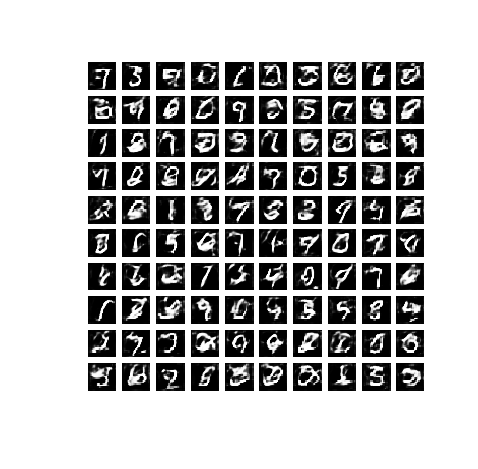

In [20]:
images = os.listdir('images/gan_images/')
images = sorted(images)


fig = plt.figure(figsize=(8, 8))

ims = []
for image in images:
    img = mgimg.imread(os.path.join('images', 'gan_images', image))
    imgplot = plt.imshow(img)
    ims.append([imgplot])
    plt.axis('off')
    
ani = animation.ArtistAnimation(fig, ims, interval=1000, blit=True,
                                repeat_delay=1000)
HTML(ani.to_jshtml())

# More on GANs

<img src="images/gans.jpeg" >